# Midterm - Environmental & Health Impacts of Warehouses in Ontario, CA
Alejandra, Georgie, Jennifer, Matthews

## Organization of this notebook 

1. Research Question
2. Data Sources
3. Data Exploration 
4. Analysis: maps and charts
   
   A. Warehouses in Ontario (charts) 
   
   B. Environmental, Social, and Health Factors in Ontario (charts and maps)
   
   C. Land uses in Ontario (charts and maps)
5. Team

## Research Question

Our project seeks to explore the relationship between warehouses and environmental, social, and health outcomes in the communities surrounding them in Ontario, California.

[Link to project proposal](https://github.com/rg-al/UP221-cargo/blob/main/Project%20Materials/ProjectPrososal.ipynb)

## Data Sources

[Environmental Justice Index](https://onemap.cdc.gov/portal/apps/sites/#/eji-explorer)(EJI)

The EJI is a newer index administered by the CDC that provides information on what communities experience severe cumulative impacts from environmental burden. This dataset provides environmental, social, and health data that we use to identify the causes of vulnerability for the communities in Ontario. Selected indicators from this dataset can be overlaid with warehouse data to identify a link between the growth of warehouses in the area and environmental justice burdens.

[Warehouse CITY data](https://radicalresearch.shinyapps.io/WarehouseCITY/)

The Warehouse CITY (communitY Cumulative Impact Tool) data data currently contains information on assessor parcel number, year built, and type. This data is collected with the purpose of providing a tool to help communities in Southern California understand and quantify the cumulative impacts of warehouses in the region. 

[California State Geoportal](https://gis.data.ca.gov/)

This dataset provides access to various geospatial data and services related to the state of California, including data on topography, demographics, land use, natural resources, and other related topics. We downloaded geojson files of Ontario city’s schools, parks, the airport, or any public places to see their locations and how warehouses may possibly impact people using these facilities.

## Data exploration

Exploring basic information of all the data of EJI, warehouses, and related facilities of Ontario city.  

In [1]:
#importing the neccesary libraries

import pandas as pd
import geopandas as gpd
import plotly as plt
import folium 
import matplotlib.pyplot as mplt
import contextily as ctx
from shapely import wkt
from shapely.wkt import loads
import plotly.express as px
import osmnx as ox

### Environmental and Health Data Exploration
---
 Loading cleaned, filtered, and merged Environmental Justice Index and Census Tract data
 
 See ['EJIData.ipynb'](https://jupyter.idre.ucla.edu/user/alrg@ucla.edu/lab/tree/UP221-cargo/Project%20Materials/EJIData.ipynb) notebook for full process

In [5]:
# Importing EJI file
EJI =gpd.read_file('../Project Materials/EJIselectdata.geojson')
EJI.head()

,state code,county code,affgeoid,geoid,county,location,total population,day population,EJI rank,Environmental burden rank,Ozone rank,PM 2.5 rank,Diesel rank,Air toxics cancer risk,Lack of parks,Lack of walkability,railways,high volume roads,airports,"proximity to roads, rail, airports",social vulnerability sum,social vulnerability rank,% high blood pressure,% asthma,% cancer,% mental health,% diabetes,high blood pressure rank,asthma rank,cancer rank,diabetes rank,mental health rank,SHAPE__Length,SHAPE__Area,minority rank,below 200% poverty rank,No hs diploma rank,Unemployed rank,Renter rank,Households less than $75k rank,Uninsured rank,No internet rank,Over 65 rank,Under 17 rank,Disability rank,Speak limited english rank,Mobile home rank,% minority,% below poverty,% no high school diploma,% unemployed,% renter,"% households < $75,000",% uninsured,% no internet,% age 65+,% age 17 or younger,% with disability,% limited english,% mobile home,% group quarters,geometry
0,06,071,1400000US06071001307,06071001307,San Bernardino,"Census Tract 13.07, San Bernardino County, Calif",4212,2345,0.6649,0.8834,0.9952,0.9739,0.7475,0.7015,0.3853,0.4618,0.7891,0.6778,0.0000,0.7220,0.6535,7.7705,25.3,9.4,4.3,14.4,11.8,0.1419,0.3966,0.0881,0.6264,0.5495,4784.119192,1.282029e+06,0.8805,0.6010,0.9362,0.7600,0.1765,0.8216,0.6942,0.4223,0.1442,0.7724,0.2400,0.8764,0.0000,85.0,35.1795,31.2,7.5,5.4,39.6300,10.6,14.3,9.1,26.3,8.9,10.3,0.0,0.2,"POLYGON ((-117.62857 34.09215, -117.62856 34.0..."
1,06,071,1400000US06071001703,06071001703,San Bernardino,"Census Tract 17.03, San Bernardino County, Calif",5680,2388,0.4366,0.6255,0.9891,0.9907,0.8804,0.9168,0.3853,0.2587,0.2622,0.7666,0.0000,0.4965,0.4843,6.7443,26.4,9.2,5.0,13.1,10.8,0.1893,0.3389,0.1785,0.5105,0.3970,5575.388721,1.908278e+06,0.7894,0.3592,0.8008,0.4170,0.1601,0.5033,0.4964,0.1064,0.3748,0.3137,0.1654,0.8417,0.8008,67.8,23.1544,19.6,4.2,5.1,26.3285,7.0,5.6,13.6,19.4,7.8,8.1,10.8,0.6,"POLYGON ((-117.66764 34.03029, -117.66760 34.0..."
2,06,071,1400000US06071001812,06071001812,San Bernardino,"Census Tract 18.12, San Bernardino County, Calif",3477,2913,0.9054,0.9883,0.9899,0.9872,0.9018,0.9470,0.3853,0.4052,0.7891,0.5731,0.0000,0.6576,0.9334,9.8990,27.5,9.8,4.2,15.8,13.7,0.2437,0.5157,0.0785,0.7878,0.6957,4243.720821,8.871496e+05,0.9237,0.8559,0.9664,0.6674,0.8155,0.9616,0.7846,0.7864,0.2360,0.7568,0.4277,0.9465,0.0000,92.1,53.7091,37.9,6.3,22.3,53.0762,13.0,26.5,11.1,26.0,11.4,18.2,0.0,1.8,"POLYGON ((-117.65077 34.04925, -117.65074 34.0..."
3,06,071,1400000US06071001002,06071001002,San Bernardino,"Census Tract 10.02, San Bernardino County, Calif",5929,1960,0.6587,0.7748,0.9913,0.9785,0.7307,0.7717,0.3853,0.2799,0.7891,0.2781,0.0000,0.5144,0.7037,8.0941,25.1,9.7,3.7,15.7,11.3,0.1349,0.4859,0.0400,0.5716,0.6859,4410.506266,1.202110e+06,0.9182,0.7073,0.9280,0.3881,0.6565,0.9362,0.8124,0.7367,0.0565,0.9135,0.1310,0.9097,0.0000,91.3,41.5937,30.0,4.0,16.0,49.3195,13.9,24.3,6.4,30.3,7.2,13.3,0.0,0.0,"POLYGON ((-117.68082 34.07406, -117.68082 34.0..."
4,06,071,1400000US06071001310,06071001310,San Bernardino,"Census Tract 13.10, San Bernardino County, Calif",6193,2689,0.7382,0.9542,0.9944,0.9768,0.7394,0.7096,0.3853,0.3119,0.6800,0.7666,0.9214,0.9793,0.7845,8.6517,27.5,9.3,4.9,13.8,12.0,0.2437,0.3679,0.1641,0.6463,0.4797,5320.830383,1.414418e+06,0.8778,0.5535,0.9187,0.6579,0.3368,0.7326,0.4549,0.3971,0.2887,0.8183,0.3372,0.9020,0.5234,84.5,32.6739,28.8,6.2,8.3,34.8688,6.4,13.6,12.1,27.3,10.2,12.5,0.9,3.2,"POLYGON ((-117.64145 34.08708, -117.64144 34.0..."


In [3]:
# Setting the crs to epsg:4326
EJI.crs = 'epsg:4326'

### Ontario Land Use Data Exploration


In [4]:
#defining the area of interest with an address
address = 'Ontario International Airport, Vineyard Avenue, Racimo, Ontario, San Bernardino County, California, 91761, United States'

In [5]:
#obtaining building data from OSM for the entire city
osm = ox.geometries_from_address(address,tags={'building':True},dist=5000)

In [6]:
#getting more info on the dataset
#determining hoow many rows/columns
osm.shape
#this dataset has 8264 rows and 133 columns

(3119, 130)

In [7]:
#determining datatype
type(osm)
#this is a geodataframe

geopandas.geodataframe.GeoDataFrame

In [8]:
#displaying 10 random rows
osm.head()

addr:state building  ele gnis:county_name  \
element_type osmid                                                 
node         368173617         CA      yes  377   San Bernardino   
             479791356         CA      yes  NaN              NaN   
             479791359         CA      yes  NaN              NaN   
             479791362         CA      yes  NaN              NaN   
             518277168         CA      yes  NaN              NaN   

                       gnis:feature_id gnis:reviewed  \
element_type osmid                                     
node         368173617         1844432            no   
             479791356             NaN           NaN   
             479791359             NaN           NaN   
             479791362             NaN           NaN   
             518277168             NaN           NaN   

                                             name  \
element_type osmid                                  
node         368173617  F C Crowell Memorial Hall   
             479791356                        NaN   
             479791359                        NaN   
             479791362                        NaN   
             518277168                     Subway   

                                                            source  \
element_type osmid                                                   
node         368173617                               USGS Geonames   
             479791356  survey;image;yahoo_imagry;local_government   
             479791359  survey;image;yahoo_imagry;local_government   
             479791362  survey;image;yahoo_imagry;local_government   
             518277168                   image;survey;usgs_imagery   

                                           geometry         addr:city  ...  \
element_type osmid                                                     ...   
node         368173617  POINT (-117.65043 34.09696)               NaN  ...   
             479791356  POINT (-117.54560 34.08149)  Rancho Cucamonga  ...   
             479791359  POINT (-117.54563 34.08115)  Rancho Cucamonga  ...   
             479791362  POINT (-117.54570 34.08083)  Rancho Cucamonga  ...   
             518277168  POINT (-117.57604 34.08489)  Rancho Cucamonga  ...   

                       content generator:method generator:output:electricity  \
element_type osmid                                                             
node         368173617     NaN              NaN                          NaN   
             479791356     NaN              NaN                          NaN   
             479791359     NaN              NaN                          NaN   
             479791362     NaN              NaN                          NaN   
             518277168     NaN              NaN                          NaN   

                       generator:source generator:type power ways type  \
element_type osmid                                                       
node         368173617              NaN            NaN   NaN  NaN  NaN   
             479791356              NaN            NaN   NaN  NaN  NaN   
             479791359              NaN            NaN   NaN  NaN  NaN   
             479791362              NaN            NaN   NaN  NaN  NaN   
             518277168              NaN            NaN   NaN  NaN  NaN   

                       service:vehicle:smog_check service:vehicle:tune  
element_type osmid                                                      
node         368173617                        NaN                  NaN  
             479791356                        NaN                  NaN  
             479791359                        NaN                  NaN  
             479791362                        NaN                  NaN  
             518277168                        NaN                  NaN  

[5 rows x 130 columns]

In [9]:
#removing unspecified/unknown building types from the data

osm.drop(osm.loc[osm['building']=='unspecified'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='yes'].index,inplace=True)

In [10]:
#subsetting the data and defining which columns to keep
ctk=['geometry','building']
osm=osm[ctk]
osm.head()

geometry building
element_type osmid                                          
node         521362425  POINT (-117.59008 34.02953)    house
             521362429  POINT (-117.59027 34.02946)    house
             521362433  POINT (-117.59026 34.02885)    house
             521362436  POINT (-117.59004 34.02874)    house
             521362440  POINT (-117.59010 34.02860)    house

'ctk' dataframe has been subset to 'element_type', 'osmid', 'geometry', and 'building'

### Warehouse Data Exploration (for charts) 

In [4]:
#loading first data file on warehouse information
wh = pd.read_csv('../weekly tasks/week 4/W4-Georgie/warehouse (1).csv')
wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [5]:
#generating statistics for acreage
wh['Acres'].describe()

count    9467.000000
mean        5.871237
std         9.138117
min         1.000000
25%         2.000000
50%         3.000000
75%         6.000000
max       275.000000
Name: Acres, dtype: float64

In [6]:
#sorting warehouses by acreage size
wh.sort_values(by='Acres', ascending=False)
wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [7]:
#sorting warehouses by year built
wh.sort_values(by='Year built', ascending=True)
wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [8]:
#removing 1910 value 
# '1910' is the year given to warehouses with an unknown construction date)
wh.drop(wh.loc[wh['Year built']==1910].index, inplace=True)

In [9]:
#checking for empty values
wh.columns[wh.isna().all()].tolist()

[]

In [10]:
#filtering out unwanted columns
desired_columns=['Acres','Year built', 'Building sq.ft.']

In [11]:
#creating a copy so that the table doesn't revert to the original data
wh_new=wh[desired_columns].copy()
wh_new.head()

,Acres,Year built,Building sq.ft.
0,275,2021,7778022
1,225,2003,6381893
2,151,2016,4273702
4,106,2018,3014158
5,106,1941,2990190


The dataframe of warehouses have been cleaned up to only information of acres, year built, and building sq.ft.

### Warehouse data exploration (for maps) 

In [3]:
# See all the columns and rows.
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Import warehouse data and convert the datatype of 'Assessor parcel number' and 'Building classification' from 'int' or 'float' to 'str'
             
Warehouses = pd.read_csv('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Warehouse_Data.csv',
        dtype=
        {
            'Assessor parcel number':str,
            'Building classification':str,
        }
)

San_Bern_Parcels = gpd.read_file('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Ontario Parcels/SBCo_Parcel_Polygons.shp')

San_Bern_Parcels.rename(columns = {'ParcelNumb':'Assessor parcel number'}, inplace = True)

#merge the warehouses and parcel shapefile on the San Bernandino County Tax Assessor parcel Number
Warehouse_Parcel=Warehouses.merge(San_Bern_Parcels,on="Assessor parcel number")
Warehouse_Parcel_Geo = gpd.GeoDataFrame(Warehouse_Parcel, geometry='geometry', crs="EPSG:4326")

Warehouse_Parcel_Geo.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.,OBJECTID,OwnerName,LandValue,Improvemen,PersonalPr,ExemptionV,HomeOwnerE,Acreage,TaxStatus,TaxRateAre,Zoning,ZoningDesc,Jurisdicti,Jurisdic_1,BaseYear,PageMap,AssessDesc,AssessClas,Shape__Are,Shape__Len,geometry
0,023812175,distribution warehouse,1996,93,2646053,157685,TOYOTA MOTOR SALES U S A INC,"51,510,534","30,864,960",0,0,None,93.45,ASSESSED BY COUNTY,0004030,CITY OF ONTARIO,City of Ontario,City of Ontario,http://www.ci.ontario.ca.us/,1993,023812,DISTRIBUTION WAREHOUSE,COMMERCIAL,552237.437500,3009.581112,"POLYGON ((-117.55796 34.04799, -117.55689 34.0..."
1,021126319,transit warehouse (truck terminal),1992,70,1986082,123022,UPS WORLDWIDE FORWARDING INC,"25,587,357","54,634,664",0,0,None,66.66,ASSESSED BY COUNTY,0004004,CITY OF ONTARIO,City of Ontario,City of Ontario,http://www.ci.ontario.ca.us/,1992,021126,TRANSIT WAREHOUSE (TRUCK TERMINAL),INDUSTRIAL,414508.363281,2895.298085,"POLYGON ((-117.57896 34.04811, -117.57893 34.0..."
2,107311124,distribution warehouse,2021,62,1748594,685625,OLV PHASE II LP,"65,790,000","75,500,000",0,0,None,61.76,ASSESSED BY COUNTY,0004089,CITY OF ONTARIO,City of Ontario,City of Ontario,http://www.ci.ontario.ca.us/,2021,107311,DISTRIBUTION WAREHOUSE,INDUSTRIAL,364429.617188,2738.202572,"POLYGON ((-117.60640 33.99035, -117.60638 33.9..."
3,021121315,storage warehouse,1992,61,1723857,121965,UPS WORLDWIDE FORWARDING INC,"24,185,220","24,451,343",0,0,None,58.99,ASSESSED BY COUNTY,0004004,CITY OF ONTARIO,City of Ontario,City of Ontario,http://www.ci.ontario.ca.us/,1992,021121,STORAGE WAREHOUSE,COMMERCIAL,359815.906250,2461.426213,"POLYGON ((-117.58314 34.05195, -117.58208 34.0..."
4,023808145,distribution warehouse,1980,59,1681858,157834,COSTCO WHOLESALE CORPORATION,"76,500,000","147,900,000",0,0,None,59.42,ASSESSED BY COUNTY,0004025,CITY OF ONTARIO,City of Ontario,City of Ontario,http://www.ci.ontario.ca.us/,2021,023808,DISTRIBUTION WAREHOUSE,INDUSTRIAL,351134.007812,2355.939087,"POLYGON ((-117.53289 34.06252, -117.52727 34.0..."


## A. Analysis - Warehouses in Ontario 

#### Interactive Bar Chart - Warehouses over time

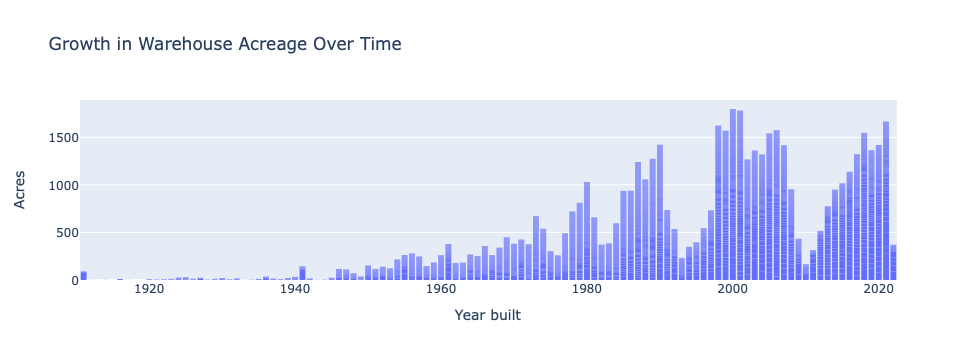

In [12]:
#use plotly to show how the the acreage per warehouse has increased over time
fig = px.bar(wh_new,
             x='Year built',
             y='Acres',
             title ='Growth in Warehouse Acreage Over Time'
            )
fig.update_traces(dict(marker_line_width=0))
fig.show()

The interactive stacked bar chart above shows the acres of warehouses built over time since 1911. 

We can observe the growth of warehousing in Ontario through this chart. Warehouse acreage has increased steadily over the years since the late 1900s. 

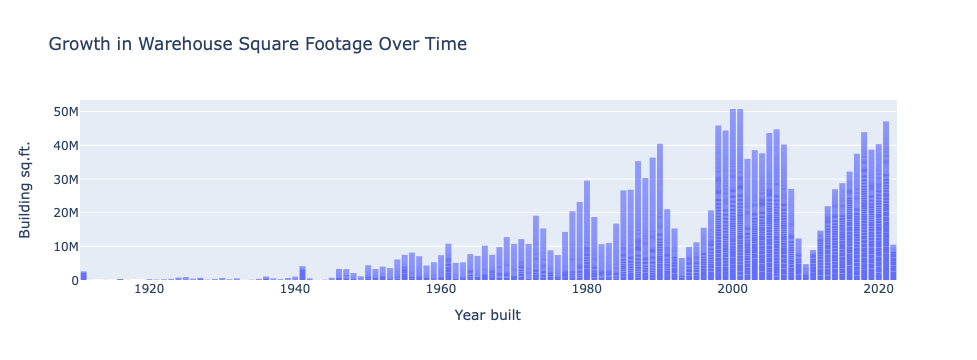

In [13]:
#trying to use plotly to show how the the acreage per warehouse has increased over time
fig = px.bar(wh_new,
             x='Year built',
             y='Building sq.ft.',
             title ='Growth in Warehouse Square Footage Over Time'
            )
fig.update_traces(dict(marker_line_width=0))
fig.show()

The interactive stacked bar chart above shows the building sq.ft of each warehouse in years. 

We can see that the total sq.ft.of each warehouse have been increasing over the years. 

#### Pie chart - Warehouse Types

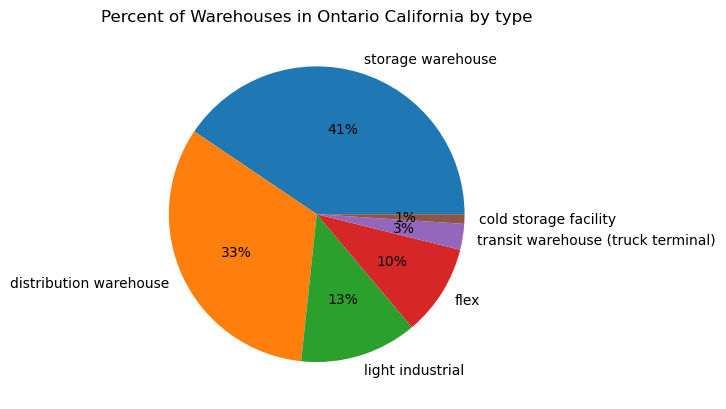

In [22]:
# Creating pie chart of warehouse types in Ontario
Warehouse_Parcel_count = Warehouse_Parcel['Building classification'].value_counts()
ax = Warehouse_Parcel_count.plot(kind='pie',title='Percent of Warehouses in Ontario California by type',autopct='%1.0f%%')
ax.get_yaxis().set_visible(False)

The pie chart above shows the distribution of warehouses based on the type of warehouse for Ontario city. 

This chart tells us that the most common type of warehouse is categorized as 'storage', followed by 'distribution' warehouses and 'light industrial' types. 

## B. Analysis - Environmental, Health, and Social Data

### Charts 

#### Simple bar chart

Environmental data

In [23]:
# Subset the EJ variables to only include fips code and air pollution columns

EJIdata2_pollution = EJI[['geoid','Ozone rank', 'PM 2.5 rank', 'Diesel rank','Air toxics cancer risk']]
EJIdata2_pollution.head()
EJIdata2_pollution.sort_values(by='PM 2.5 rank', ascending=False).head(5)

,geoid,Ozone rank,PM 2.5 rank,Diesel rank,Air toxics cancer risk
16,06071001903,0.9865,0.9955,0.7307,0.8310
36,06071001906,0.9935,0.9955,0.8541,0.8709
17,06071001905,0.9894,0.9953,0.8064,0.8851
29,06071002206,0.9938,0.9948,0.8882,0.9165
18,06071001809,0.9930,0.9947,0.8919,0.9207


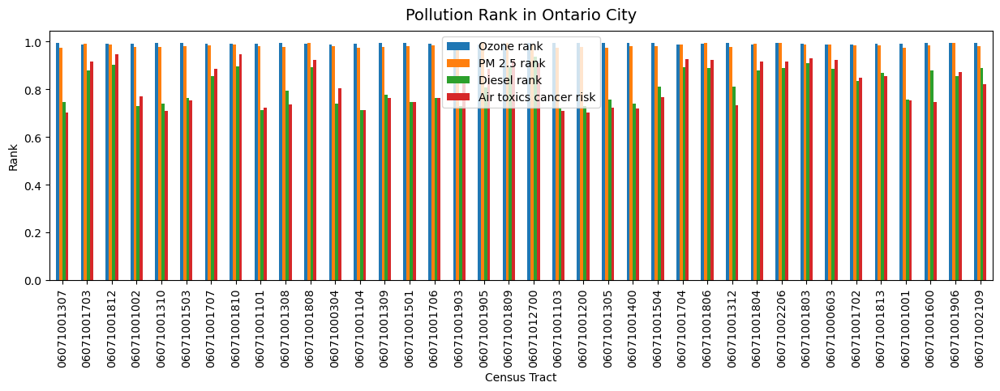

In [24]:
# Create bar chart of all air pollution 
fig, ax = mplt.subplots(figsize=(15,4))

EJIdata2_pollution.plot.bar(ax=ax,
                                      x='geoid',
                                      legend=True,
                                      )
ax.set_xlabel('Census Tract') # override x label
ax.set_ylabel('Rank') # override y label
ax.set_title("Pollution Rank in Ontario City",fontsize=14,pad=10); # multi-line title with padding

The static bar chart above provides a visualization of the levels of different types of pollutants for each of the census tracts for Ontario. The pollutants are shown as percentiles/ranks. 

The pollutants included in this chart are: 
- Ozone
- PM 2.5
- Diesel
- Air toxics cancer risk (based on continous exposure to pollutants)

This chart is not very helpful since most people don't recognize census tract numbers. A different visualization, such as a map, could provide a better analysis of this data (see maps below). Alternatively, a bar chart of each of the environmental variables could provide information on the census tracts with the highest and lowest levels for each specific pollutant. We provide these charts below. 

#### Interactive bar charts with plotly - Environmental data


##### Ozone pollution

/tmp/ipykernel_1374/1206756231.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



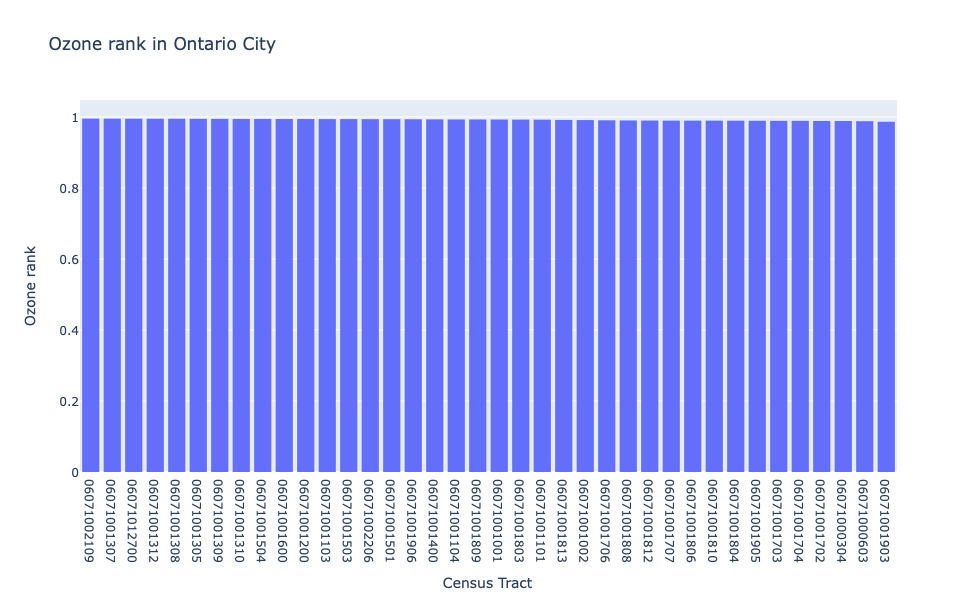

In [25]:
#sort the data in descending order
EJIdata2_pollution.sort_values(by='Ozone rank', ascending=False, inplace = True)

# Create interactive bar chart

# for interactive plots
# add labels by providing a dict
fig = px.bar(
        EJIdata2_pollution,
        x='geoid',
        y='Ozone rank',
        title='Ozone rank in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

We chose not to use color for the Ozone chart because the difference between census tracts is very minimal. 

All of the census tracts in Ontario have a high risk of exposure to Ozone pollution. 

This is an interactive chart that allows users to hover over the bars to see the values for each of the cencus tracts. 

##### PM 2.5 pollution

/tmp/ipykernel_1374/1671732611.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



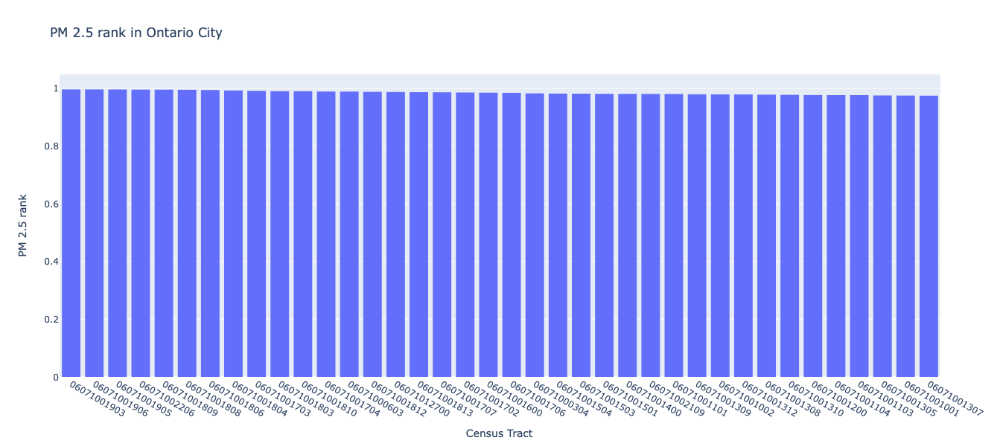

In [26]:
#sort the data in descending order
EJIdata2_pollution.sort_values(by='PM 2.5 rank', ascending=False, inplace = True)

# Create interactive bar chart

# for interactive plots
# add labels by providing a dict
fig = px.bar(
        EJIdata2_pollution,
        x='geoid',
        y='PM 2.5 rank',
        title='PM 2.5 rank in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

The PM 2.5 chart also showed small differences between census tracts. 

All census tracts in Ontario have a high risk of PM 2.5 pollution exposure. 

This is an interactive chart that allows users to hover over the bars to see the values for each of the cencus tracts. 

##### Diesel pollution

/tmp/ipykernel_1374/516194810.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



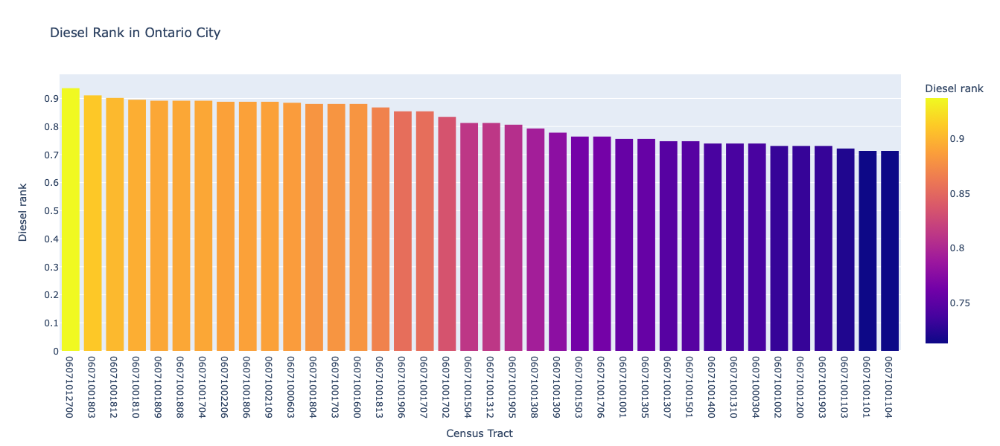

In [27]:
#sort the data in descending order
EJIdata2_pollution.sort_values(by='Diesel rank', ascending=False, inplace = True)

# Create interactive bar chart

# for interactive plots
# add labels by providing a dict
fig = px.bar(
        EJIdata2_pollution,
        x='geoid',
        y='Diesel rank',
        color = 'Diesel rank',
        title='Diesel Rank in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

The Diesel rank chart does show a lot more variation between census tracts. This is likely due to many factors, including the proximity to high occupancy roads or highways, that each census tract has. Despite these differences, about half of the census tracts face very high risk of Diesel pollution exposure, while the rest of the tracts have high and moderate levels of Diesel exposure.  

This is an interactive chart that allows users to hover over the bars to see the values for each of the cencus tracts. 

##### Cancer risk - air toxins exposure

/tmp/ipykernel_1374/1716576259.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



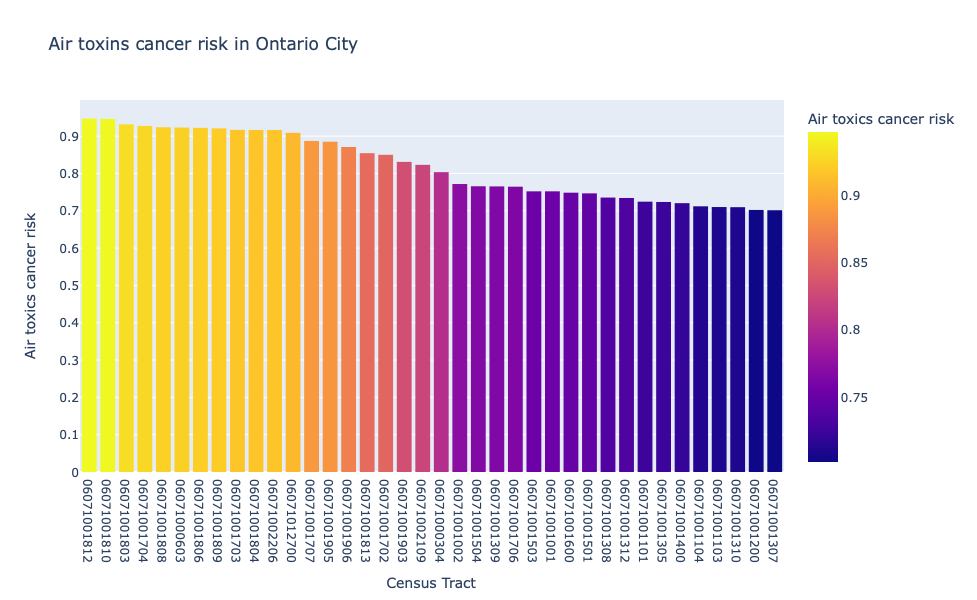

In [28]:
#sort the data in descending order
EJIdata2_pollution.sort_values(by='Air toxics cancer risk', ascending=False, inplace = True)

# Create interactive bar chart

# for interactive plots
# add labels by providing a dict
fig = px.bar(
        EJIdata2_pollution,
        x='geoid',
        y='Air toxics cancer risk',
        color = 'Air toxics cancer risk',
        title='Air toxins cancer risk in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

The cancer risk chart shows in which census tracts people have the highest risk of developing cancer due to continuous exposure to air pollutants.

This is an interactive chart that allows users to hover over the bars to see the values for each of the cencus tracts. 

### Maps - environmental, health, and social data

/tmp/ipykernel_414/3830367513.py:44: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='orange',markersize=2);
/tmp/ipykernel_414/3830367513.py:44: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='orange',markersize=2);
/tmp/ipykernel_414/3830367513.py:44: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='orange',markersize=2);
/tmp/ipykernel_414/3830367513.py:44: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are l

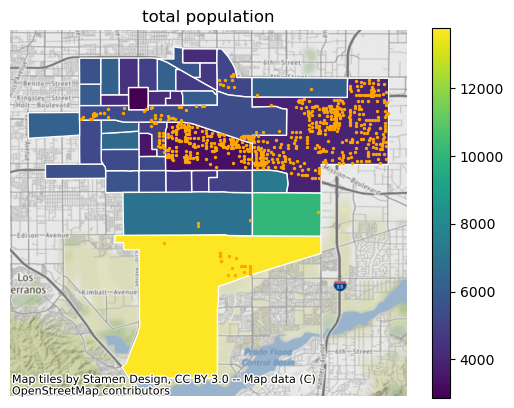

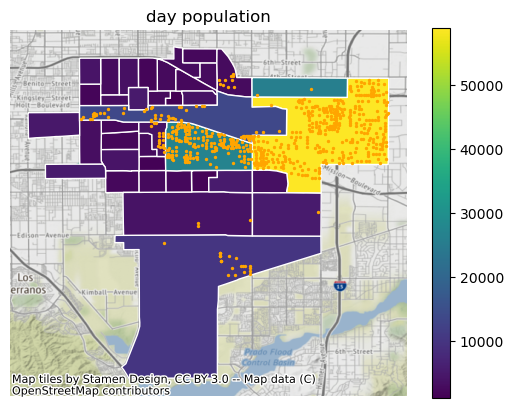

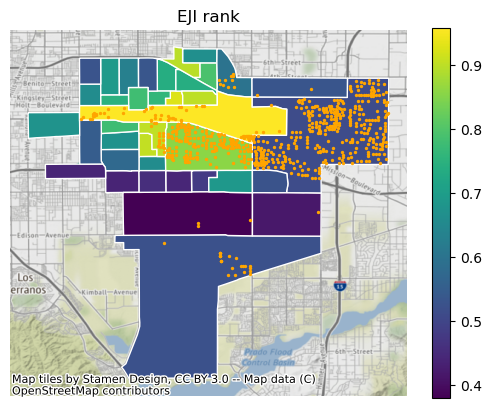

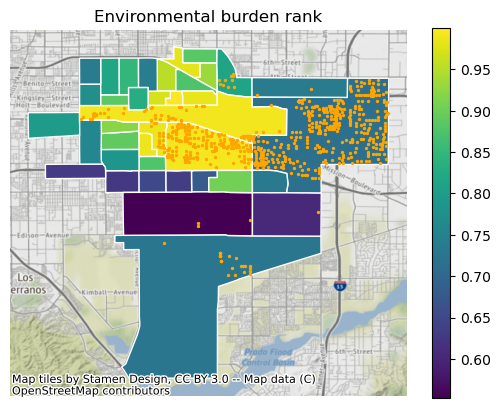

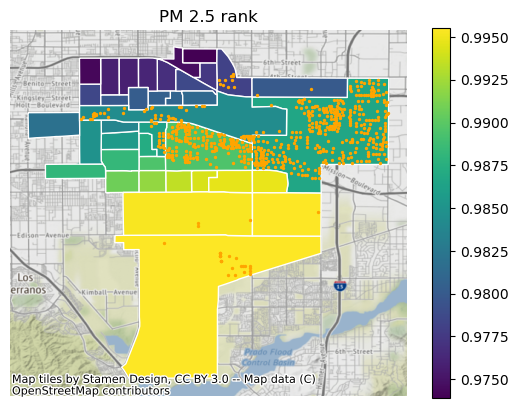

...

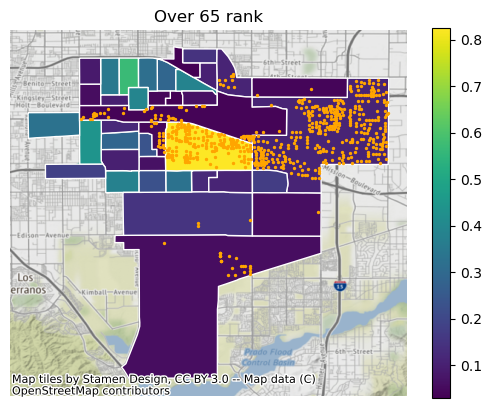

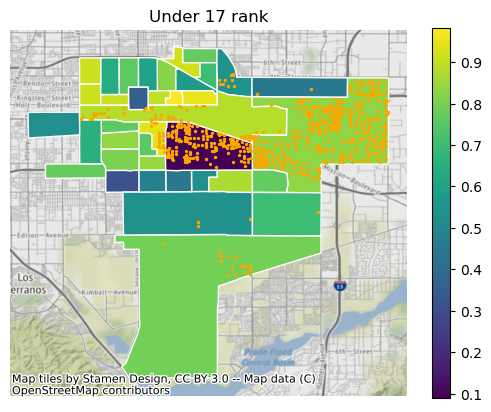

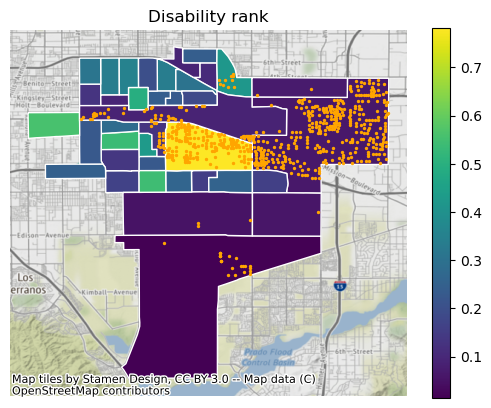

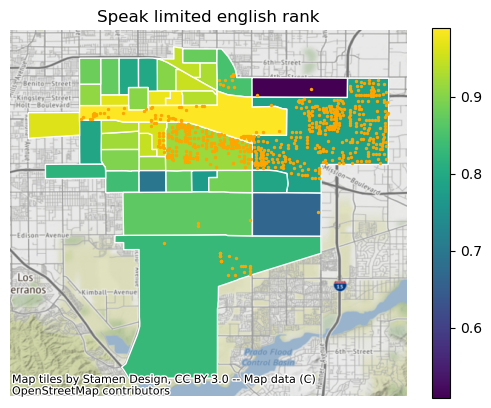

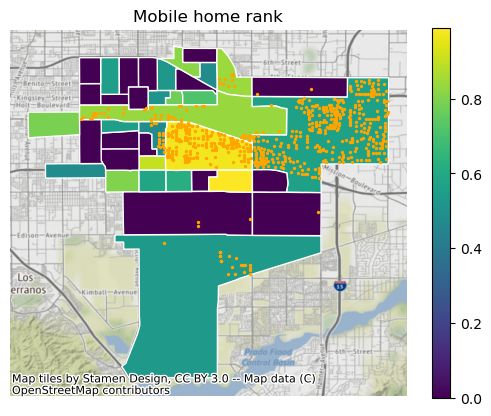

In [6]:
# using a loop to create the maps

variables = ['total population',
 'day population',
 'EJI rank',
 'Environmental burden rank',
 'PM 2.5 rank',
 'Diesel rank',
 'Air toxics cancer risk',
 'Lack of parks',
 'Lack of walkability',
 'railways',
 'high volume roads',
 'airports',
 'proximity to roads, rail, airports',
 'social vulnerability rank',
 '% high blood pressure',
 '% asthma',
 '% cancer',
 '% mental health',
 '% diabetes',
 'high blood pressure rank',
 'asthma rank',
 'cancer rank',
 'diabetes rank',
 'mental health rank', 
 'minority rank',
'below 200% poverty rank',
'No hs diploma rank',
'Unemployed rank',
'Renter rank',
 'Households less than $75k rank',
 'Uninsured rank',
 'No internet rank',
 'Over 65 rank',
 'Under 17 rank',
 'Disability rank',
 'Speak limited english rank',
 'Mobile home rank']

# Loop the variables
for variable in variables:
    ax = EJI.plot(column=variable, edgecolor="white", legend=True)
    Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='orange',markersize=2);
    ax.set_title(variable)
    ax.set_axis_off()
    ctx.add_basemap(ax, crs=4326);

We used a loop to create the maps above to analyze a handful of environmental, health, and social metrics and their relationship to warehouse locations in Ontario. Below are some observations from these maps for each variable. 

#### Total population
The majority of the warehouses are located in census tracts with lower population levels.
#### Day population
The day population is highest for the census tracts where the majority of the warehouses are in. That means that the people who work in Ontario are directly impacted by the warehouses through geographic proximity.
#### EJI rank'
The EJI rank measures overal environmental justice for communities. The map shows that the census tracts near warehouses face envrionmental justice concerns. 
#### Environmental burden rank
Census tracts near or with warehouses have higher environmental burden ranks. 
#### PM 2.5 rank
From the chart above, we know that PM 2.5 is very similar for all census tracts so this map doesn't tell us too much information. 
#### Diesel rank
The map shows a correlation between warehouses and diesel pollution risk 
#### Air toxics cancer risk
There seems to be some correlation between air toxic cancer risk and the location of warehouses but the correlation is not strong since other census tracts with limited warehouse presence also have high air toxic cancer risk levels. 
#### Lack of parks
This map might help explian the Air toxics cancer risk anomaly explained above since the census tracts with higher levels of air toxics cancer risk seem to lack parks. 
#### Lack of walkability
No notable observations for this variable. 
#### railways
This map makes sense since warehouses need access to railway infrastructure. The higher levels for the railways were inside the census tracts with hihgh numbers of warehouses. 
#### high volume roads
Similarly, census tracts with high volume roads were mostly next to or in the census tracts with the most warehouse precense. 
#### airports
Almost all the warehouses in Ontario are in census tracts with high levels of proximity to airports. 
#### proximity to roads, rail, airports
This variable adds up the previous 3 variables. The map shows that the most connected (rails, roads, airports) census tracts are those that have a hogh concentration of warehouses. 
#### social vulnerability rank
This variable comes from the Social Vulnerability Index published by the CDC. The map shows that many of the residents in Ontario have a high SVI score, but there's not a clear connetion to warehouse location. This could be due to the fact that most people in Ontario don't tend to live in census tracts with high concentrations of warehouses, but they might work there and spend a big chunk of the life directly exposed to the negative effects of warehouses. 

The following variables might be similarly impacted by population (where people live vs. where they work, play, study, etc.). For example, many people might asthma in one census tract without any warehouses. From this data, we don't know if the majority of the people with asthma frequent the census tracts with high concentrations of warehouses. More investigation is needed to understand if there's a link between warehouses and health metrics but it's not likely possible to do since that kind of detailed health data is typically not publicly accessible. 
#### % high blood pressure
Some relationship between warehouses and people with high blood pressure
#### % asthma
Varied relationship between warehouses and people with asthma 
#### % cancer
Some relationship between warehouses and people with cancer
#### % mental health
Limited relationship between warehouses and mental health
#### % diabetes  
Varied relationship between warehouses and people with diabetes 
#### high blood pressure rank
Varied relationship between warehouses and people with high blood pressure (percentile)
#### asthma rank
Limited relationship between warehouses and people with asthma (percentile) 
#### cancer rank
Varied relationship between warehouses and people with cancer (percentile)
#### diabetes rank
Some relationship between warehouses and people with diabetes (percentile)
#### mental health rank
Limited relationship between warehouses and mental health (percentile)

---
#### The following variables were added into the loop per recommendations by our classmates to consider demographic data:
- 'minority rank',
- 'below 200% poverty rank',
- 'No hs diploma rank',
- 'Unemployed rank',
- 'Renter rank',
- 'Households less than $75k rank',
- 'Uninsured rank',
- 'No internet rank',
- 'Over 65 rank',
- 'Under 17 rank',
- 'Disability rank',
- 'Speak limited english rank',
- 'Mobile home rank'

These variables make up the SVI (which was previously included in our analysis). For future analysis, we want to move this demographic data up to our introduction to help paint a picture of who lives in Ontario. 

---
Now we have the static maps of all health, air pollution, and some EJ variables that showing their ranks and relationships with warehouses.   

#### Creating an Interactive Map of Desiel emisions in Ontario

Often times, its useful for urban planners to see the spatial relationships between infrastructture, ammentieies, and environmental conditions. To do this, we can use the Folium library along with our census tract data to create an interactive map. For this project, we would like to see the spatial relation between desiel emisions, the airport, public parks, and schools. Let's start by bringing in all our necessary data and python libraries.

In [30]:
# See all the columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Import the file and convert the datatypes
EJIdata3=pd.read_csv('../Data/EJI Variables and Warehouse Marked.csv')
EJIdata3['geometry'] = EJIdata3['geometry'].apply(wkt.loads)
EJIdata3 = gpd.GeoDataFrame(EJIdata3, geometry='geometry', crs="EPSG:4326")
airports=gpd.read_file('../Data/Airport_Schools_Parks_Location/Airport_Boundaries_Ontario.geojson')
parks=gpd.read_file('../Data/Airport_Schools_Parks_Location/CPAD_Shapes/CPAD_2022b_Holdings.shp')
schools=gpd.read_file('../Data/Airport_Schools_Parks_Location/California_Schools_2021-22_San Berdarnido.geojson')

Now using Folium, we can begin to explore the data that we have. We have to reproject the parks files as well, to keep in the system projection system as the other data.

In [31]:
schools=schools[schools['City']=='Ontario'];

parks.to_crs(epsg=4326, inplace=True);
parks1=parks[parks['CITY']=='Ontario'];
parks1["geometry"] = parks1["geometry"].centroid

/tmp/ipykernel_1374/1694539781.py:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
#start our map
m = folium.Map(location=[34.041103, -117.597585],
               zoom_start = 13,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=EJIdata3, # geo data
                  data=EJIdata3, # data          
                  key_on='feature.properties.geoid', # key, or merge column
                  columns=['geoid','Diesel rank'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.3, 
                  fill_opacity=0.6,
                  line_opacity=0.8, # line opacity (of the border)
                  legend_name='Diesel Emission Percentile Rank').add_to(m)    # name on the legend color bar
#Add the Airport in Red
folium.Marker([34.05627, -117.59574], popup='<i>Ontario Airport</i>', icon=folium.Icon(color="red")).add_to(m)

#Add the Schools in Blue
for index, row in schools.iterrows():
    # add folium marker code
    folium.Marker([row.geometry.y, row.geometry.x], popup=row.SchoolName, tooltip=row.SchoolName).add_to(m)
    
# Add the Parks in Green
for index, row in parks1.iterrows():
    # add folium marker code
    folium.Marker([row.geometry.y, row.geometry.x], popup=row.SITE_NAME, tooltip=row.SITE_NAME, icon=folium.Icon(color="green")).add_to(m)
    # add folium marker code
m

This interactive map can tell us about a select variable (in this case 'Diesel Rank') and the connection of that rank to the locations of schools, parks, and the Ontario airport. 

We hope to expand on this map as our project progresses to add more interactive features. 

## C. Analysis - Land Uses

#### Basic bar chart - Ontario land use data

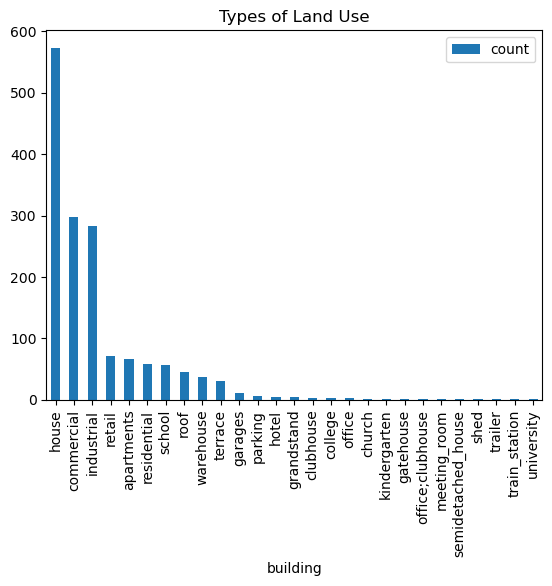

In [33]:
# Count the numbers of each building type.
osm_build_count=osm.value_counts(['building']).reset_index(name="count")
osm_build_count

#Visualizing the data through a bar chart
osm_build_count.plot.bar(x='building', title= 'Types of Land Use');


The bar chart above shows the counts for each type of land uses that are close to the Ontario airport.

The chart tells is that the most common types of land uses in Ontario are residential, followed by commercial and industrial land uses.  

#### Improved bar chart - Ontario land use data

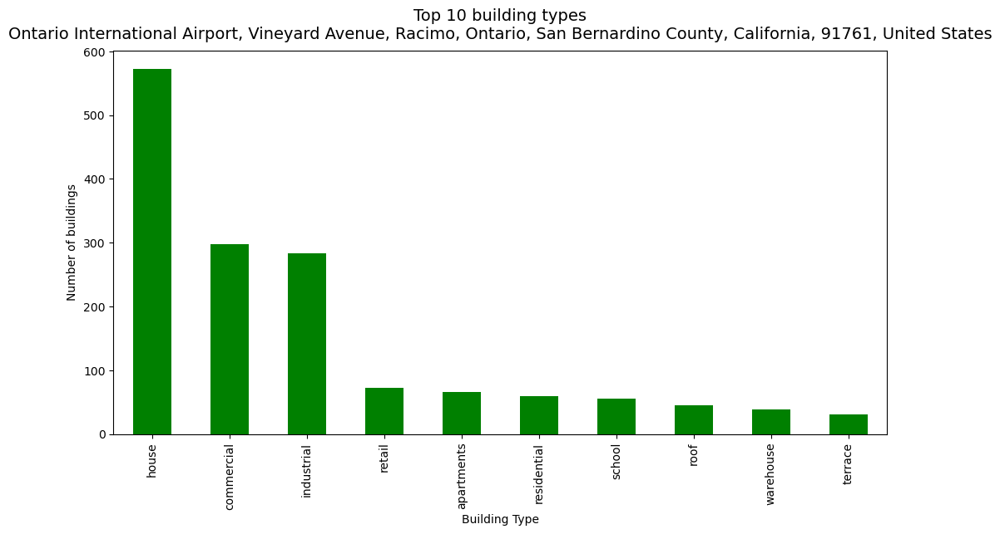

In [34]:
#creating a more readable chart for Ontario land uses

fig, ax = mplt.subplots(figsize=(12,6))

osm_build_count[:10].plot.bar(ax=ax,
                                      x='building',
                                      y='count',
                                      legend=False,
                                      color='green'
                                      )
ax.set_xlabel('Building Type') # override x label
ax.set_ylabel('Number of buildings') # override y label
ax.set_title("Top 10 building types\n"+address,fontsize=14,pad=10); # multi-line title with padding

In the chart above, we added a title, labels for the y and x axis, and adjusted the size of the chart to make it more readable. 

#### Interactive bar chart - Ontario land use data

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



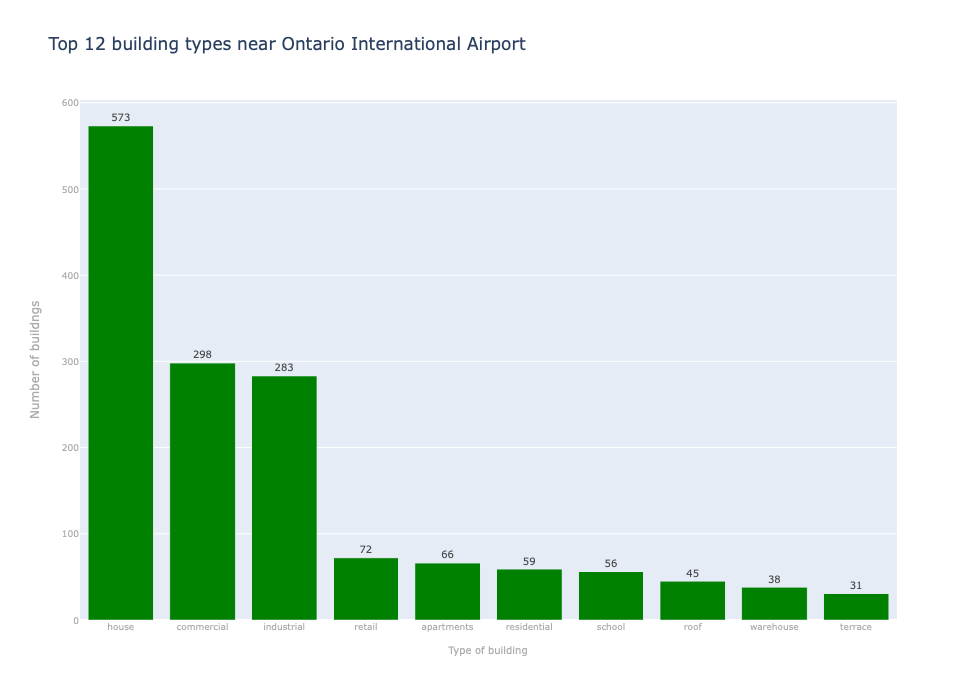

In [35]:
# creating a plotly interactive chart

fig = px.bar(osm_build_count.head(10),
        x='building',
        y='count',
        title="Top 12 building types near Ontario International Airport", 
        text_auto = True,
        height=700,
        width=900,
        color_discrete_sequence =['green']*len(osm_build_count),
        labels={
                'count': 'Number of buildngs',
                'building': 'Type of building',
        })

# labeling the bar
fig.update_traces(textposition='outside',textfont_size=10,textfont_color='#444')

# labeling the axes
fig.update_yaxes(title_font_size=12,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=9)
fig.update_xaxes(title_font_size=10,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=9)

# show the figure
fig.show()

The chart aove is an interactive bar chart showing the counts of all building types in Ontario.

#### Land Uses Maps/Plots
Maps to visualize the building land uses in Ontario city.

<AxesSubplot: >

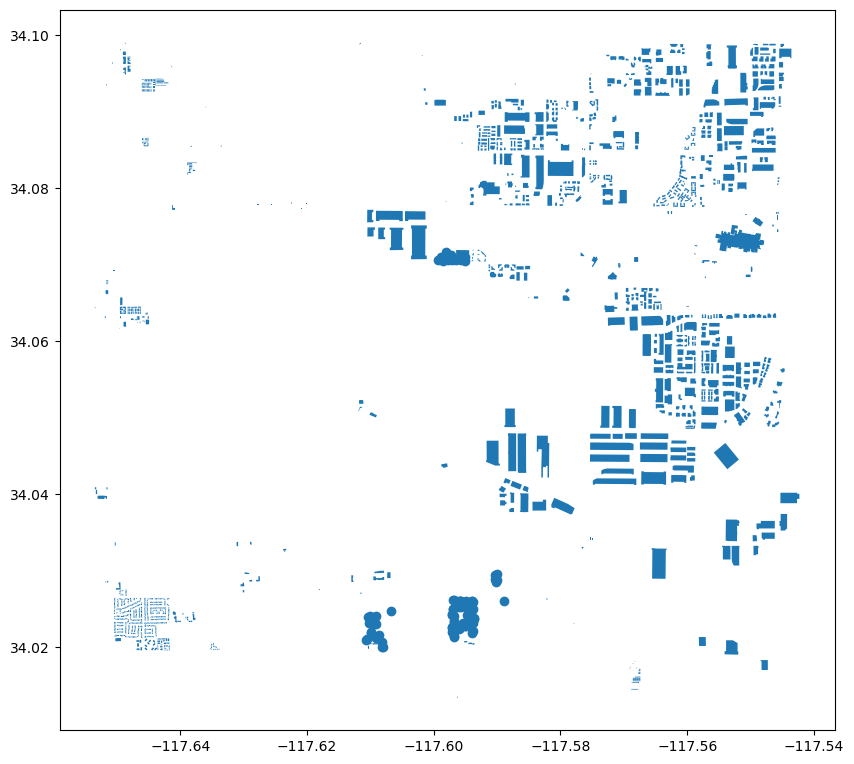

In [36]:
# Plot the osm dataframe, whichs contain the building types and geometry information
osm.plot(figsize=(10,10))

In [37]:
#removing unwanted building types using .loc
osm.drop(osm.loc[osm['building']=='trailer'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='church'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='clubhouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='garages'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='office;clubhouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='office'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='parking'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='college'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='gatehouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='hotel'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='roof'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='terrace'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='shed'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='meeting_room'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='grandstand'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='semidetached_house'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='train_station'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='kindergarten'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='commercial'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='apartments'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='retail'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='school'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='university'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='residential'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='house'].index,inplace=True)

<AxesSubplot: >

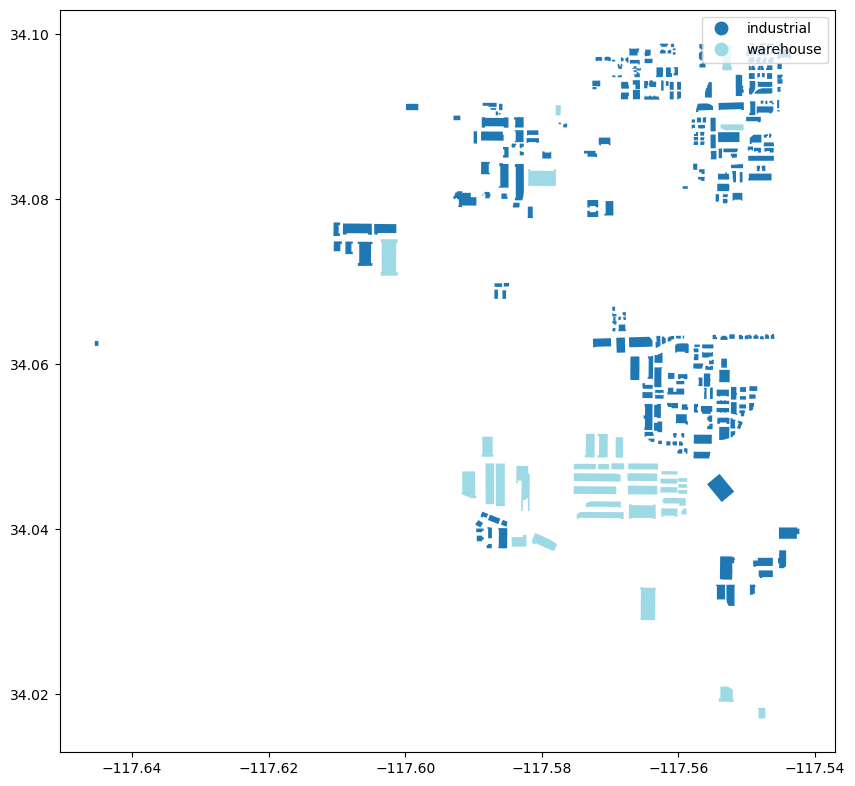

In [38]:
#Color coding the buildings
osm.plot(figsize=(10,10),
         column='building',
         cmap='tab20',
         legend=True)

In [39]:
#using Web Mercator as the projection 
osm_wm=osm.to_crs(epsg=3857)

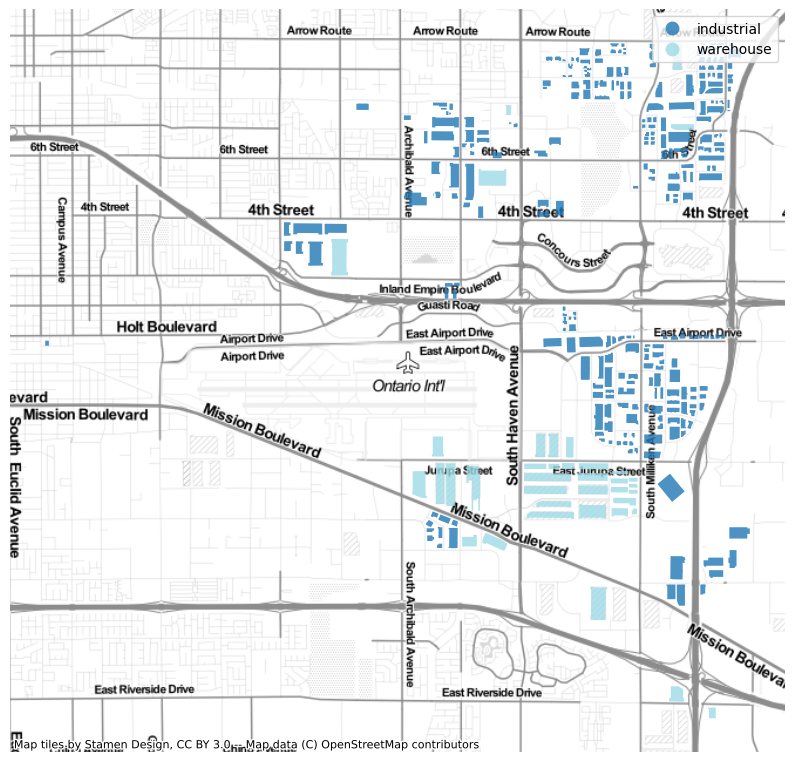

In [40]:
#adding a basemap
fig,ax=mplt.subplots(figsize=(10,10))
osm_wm.plot(ax=ax,
            column='building',
            cmap='tab20',
            legend=True,
            alpha=0.8,
           )

ax.axis('off');

ctx.add_basemap(ax=ax,
                source=ctx.providers.Stamen.TonerLite,
                alpha=1
               )

In the map above, we can see the buildings categorized as 'industrial' or 'warehouse'. 

## Team

**Alejandra Rios**: Repo manager, data collection and cleaning, assist with quantitative analysis, literature review

**Georgie Suico**: Qualitative analysis and literature review, assist with notebook design, quantitative analysis, and data collection

**Jennifer Chu**: Notebook and presentation design, assist with quantitative analysis, literature review, and data collection

**Matthews Cribioli**: Quantitative analysis, assist with qualitative analysis, literature review, and data collection